**THIS CHAPTER IS CURRENTLY UNDER CONSTRUCTION!!!**

(learning)=
# Learning



(likelihood-learning-sec)=
## A first look at likelihood-based learning objectives

To help motivate the learning objectives obtained in this section, let's begin with a simple example. Suppose that we have an observed dataset

$$
x_1,x_2,\ldots,x_m \in \{0,1\}
$$

drawn from a random variable $X \sim \Ber(\theta)$ with unknown parameter $\theta \in [0,1]$. This is a very simple example of a probabilistic graphical model whose underlying graph consists of only two nodes, one for the parameter $\theta$ and one for the (observed) random variable $X$:

```{image} ../img/bern-pgm.svg
:width: 18%
:align: center
```
&nbsp;

The probability measure $P_\theta$ proposed by the model has mass function

$$
p(x;\theta) = \theta^x (1-\theta)^{1-x},
$$ (bern-model-eq)

for $x\in \{0,1\}$, while the dataset has its empirical probability measure $\hat{P}$ with mass function $\hat{p}(x)$ defined as

$$
\hat{p}(x) = \frac{\text{frequency of $x$ in the dataset}}{m} = \begin{cases}
\displaystyle\frac{\Sigma x}{m} & : x=1, \\
\displaystyle\frac{m - \Sigma x}{m} & : x=0,
\end{cases}
$$ (bern-empirical-eq)

where $\Sigma x \def x_1 + x_2 + \cdots + x_m$. The goal, of course, is to model the observed dataset with our univariate PGM, but the parameter $\theta$ is unknown. An "optimal" value for the parameter will minimize the discrepancy (or "distance") between the two distributions $\hat{P}$ and $P_\theta$. We seek to "learn" this optimal value from the dataset.

```{margin}

Technically, according to {prf:ref}`KL-def`, in order to discuss the KL divergence we must require that the empirical distribution is absolutely continuous with respect to the model distribution, in the sense that $p(x;\theta)=0$ implies $\hat{p}(x)=0$ for all $x$. This may create some minor headaches that require addressing special cases in proofs. For an example, see the proof of {prf:ref}`bern-mle-thm` below.
```

Of course, by now we know that "distance" means KL divergence, so the goal is to locate the minimizer

$$
\theta^\star = \argmin_{\theta\in [0,1]} D(\hat{P} \parallel P_\theta).
$$

But from {prf:ref}`KL-and-entropy-thm`, the KL divergence may be expressed as a difference of two entropies,

$$
D(\hat{P} \parallel P_\theta) = H_{\hat{P}}(P_\theta) - H(\hat{P}),
$$

and since the entropy $H(\hat{P})$ does not depend on $\theta$ it may be dropped from the optimization objective, and we see that we are equivalently searching for the minimizer of cross entropy:

$$
\theta^\star = \argmin_{\theta\in [0,1]} H_{\hat{P}}(P_\theta).
$$

Let's unpack this cross entropy, using {eq}`bern-model-eq` and {eq}`bern-empirical-eq`. By definition, we have

$$
H_{\hat{P}}(P_\theta) = E_{x \sim \hat{p}(x)} \left[ I_{P_\theta}(x) \right],
$$ (cross-ent-stoch-eq)

where

$$
I_{P_\theta}(x) = -\log\left[ p(x;\theta) \right]
$$

is the surprisal function (see {prf:ref}`info-content-def`). Because we want to think of the data as being fixed and the parameter as variable, it will be convenient to define the _model surprisal function_ to be

$$
\calI(\theta;x) \def -\log\left[ p(x;\theta) \right],
$$

with the parameter $\theta$ written first, similar to our convention regarding likelihood functions in {numref}`Chapter %s <prob-models>`. In fact, if we define the _model likelihood function_ of our univariate Bernoulli model to be

$$
\calL(\theta;x) \def p(x;\theta),
$$

then the model surprisal function is nothing but the negative logarithm of the model likelihood function.

Now, note that

$$
p(x_1,\ldots,x_m; \theta) = \prod_{i=1}^m p(x_i;\theta),
$$ (bern-like-factor-eq)

since the dataset is assumed drawn from an IID random sample. If we define the left-hand side to be the _data likelihood function_,

$$
\calL(\theta;x_1,\ldots,x_m) \def p(x_1,\ldots,x_m; \theta),
$$

then we may rewrite {eq}`bern-like-factor-eq` in terms of likelihood functions as

$$
\calL(\theta;x_1,\ldots,x_m) = \prod_{i=1}^m \calL(\theta; x_i).
$$ (bern-like-factor-2-eq)

(Notice that this is identical in concept to the factorizations for the PGMs studied in {numref}`Chapter %s <prob-models>`.) Finally, if we define the _data surprisal function_ to be

$$
\calI(\theta;x_1,\ldots,x_n) \def - \log\left[ p(x_1,\ldots,x_m; \theta) \right] = - \log\left[ \calL(\theta;x_1,\ldots,x_m)\right],
$$

then we may apply the negative logarithm to both sides of {eq}`bern-like-factor-2-eq` to get the fundamental equation

$$
\calI(\theta;x_1,\ldots,x_n) = \sum_{i=1}^m \calI(\theta;x_i)
$$ (data-model-surprise-bern-eq)

expressing the data surprisal function as a sum of model surprisal functions.

Let's now bring back the cross entropy expressed above as {eq}`cross-ent-stoch-eq`. Using the model surprisal function, we may write:

$$
H_{\hat{P}}(P_\theta) = E_{x \sim \hat{p}(x)} \left[ \calI(\theta; x) \right] = \sum_{x\in \bbr} \hat{p}(x) \calI(\theta;x) = \frac{1}{m} \sum_{i=1}^m \calI(\theta;x) = \frac{1}{m} \calI(\theta;x_1,\ldots,x_m).
$$

So, putting everything together, we get that

$$
D(\hat{P} \parallel P_\theta) + H(\hat{P}) = H_{\hat{P}}(P_\theta) = E_{x \sim \hat{p}(x)} \left[ \calI(\theta; x) \right] \propto \calI(\theta; x_1,\ldots,x_m),
$$

where the constant of proportionality is the (positive) number $1/m$. Moreover, since the negative logarithm function is strictly decreasing, minimizing the data surprisal function with respect to $\theta$ is equivalent to maximizing the data likelihood function with respect to $\theta$. If we combine all of our observations into a single theorem, we get:

```{margin}

As mentioned in the margin note above, in this theorem we are implicitly restricting our attention to those parameters $\theta$ for which the empirical distribution $\hat{P}$ is absolutely continuous with respect to the model distribution $P_\theta$.
```

```{prf:theorem} Equivalent learning objectives for the univariate Bernoulli model
:label: equiv-obj-bern-thm

Let

$$
x_1,x_2,\ldots,x_m \in \{0,1\}
$$

be an observed dataset corresponding to a Bernoulli random variable $X\sim \Ber(\theta)$ with unknown $\theta$. Let $P_\theta$ be the model distribution of $X$ and let $\hat{P}$ be the empirical distribution of the dataset. The following optimization objectives are equivalent:

1. Minimize the KL divergence $D(\hat{P} \parallel P_\theta)$ with respect to $\theta$.
2. Minimize the cross entropy $H_{\hat{P}}(P_\theta)$ with respect to $\theta$.
3. Minimize the data surprisal function $\calI(\theta; x_1,\ldots,x_m)$ with respect to $\theta$.
4. Maximize the data likelihood function $\calL(\theta; x_1,\ldots,x_m)$ with respect to $\theta$.
```

Though these optimization objectives are all equivalent to each other, they have different interpretations, conceptualizations, and advantages:

> 1. Minimizing the KL divergence between the empirical and model distributions has an immediate and concrete interpretation as minimizing the "distance" between these two distributions.
> 2. As a function of $\theta$, the cross entropy $J(\theta) = H_{\hat{P}}(P_\theta)$ may be viewed as a stochastic objective function, since it is exactly the mean of the model surprisal function. This opens the door for applications of the stochastic gradient descent algorithm studied in {numref}`sgd-sec`.
> 3. The third optimization objective seeks the model probability distribution according to which the data is _least surprising_.
> 4. The fourth optimization objective seeks the model probability distribution according to which the data is _most likely_.

Due to the equivalence with the fourth optimization objective, all these optimization objectives are referred to as _likelihood-based learning objectives_. The optimization process is then called _maximum likelihood estimation_ (*MLE*), and the value

\begin{align*}
\theta^\star_\text{MLE} &\def \argmax_{\theta \in [0,1]} \calL(\theta; x_1,\ldots,x_m) \\
&= \argmin_{\theta \in [0,1]} \calI(\theta; x_1,\ldots,x_m) \\
&= \argmin_{\theta \in [0,1]} H_{\hat{P}}(P_\theta) \\
&= \argmin_{\theta \in [0,1]} D(\hat{P} \parallel P_\theta)
\end{align*}

is called the _maximum likelihood estimate_ (also _MLE_). But in actual real-world practice, nobody _ever_ maximizes the likelihood function directly due to numerical instability (and other reasons), and instead one of the other three learning objectives is used.

It will turn out that a version of {prf:ref}`equiv-obj-bern-thm` holds for all probabilistic graphical models with discrete model distributions, not just our univariate Bernoulli model. But for the Bernoulli model, the MLE may be computed in closed form:

```{prf:theorem} MLE for the univariate Bernoulli model
:label: bern-mle-thm

Let $ x_1,x_2,\ldots,x_m \in \{0,1\}$ be an observed dataset corresponding to a Bernoulli random variable $X\sim \Ber(\theta)$ with unknown $\theta$. Then the (unique) maximum likelihood estimate $\theta^\star_\text{MLE}$ is the ratio $ \Sigma x/m$.
```

```{prf:proof}
We first address the special cases that $\Sigma x =0$ or $m$. In the first case, the data likelihood function is given by

$$
\calL(\theta; x_1,\ldots,x_m ) = \theta^{\Sigma x} (1-\theta)^{m-\Sigma x} = (1-\theta)^m.
$$

But the latter expression is maximized at $\theta^\star=0$, and so $\theta^\star_\text{MLE} = \Sigma x/m$, as claimed. A similar argument shows that if $\Sigma x = m$, then the likelihood function is maximized at $\theta^\star = 1$, and so $\theta^\star_\text{MLE} = \Sigma x / m$ again.

So, we may assume that $0 < \Sigma x < m$. In this case, the maximizer of the likelihood function must occur in the open interval $(0,1)$. Thus, by {prf:ref}`equiv-obj-bern-thm`, the parameter $\theta^\star_\text{MLE}$ is equivalently the global minimizer of the data surprisal function

$$
\calI(\theta;x_1,\ldots,x_m ) = -\Sigma x \log{\theta} - (m-\Sigma x) \log{(1-\theta)}.
$$

But minimizers of this function can only occur at points $\theta^\star \in (0,1)$ where

$$
\frac{\partial}{\partial \theta}\Bigg|_{\theta = \theta^\star} \calI(\theta; x_1,\ldots,x_m) = 0.
$$ (sur-station-eq)

But 

$$
\frac{\partial}{\partial \theta} \calI (\theta; x_1,\ldots,x_m) = -\frac{\Sigma x}{\theta} + \frac{m-\Sigma x}{1-\theta},
$$

and a little algebra yields the solution $\theta^\star = \Sigma x/m$ to the stationarity equation {eq}`sur-station-eq`. To confirm that $\theta^\star = \Sigma x/m$ is a global minimizer over $(0,1)$, note that the second derivatives of both $-\log{\theta}$ and $-\log{(1-\theta)}$ are always positive, and hence the data surprisal function is strictly convex. Thus, $\theta^\star_\text{MLE} = \Sigma x/m$ must indeed be the (unique) MLE. Q.E.D.
```

Though the $\theta^\star_\text{MLE}$ is available in closed form for our univariate Bernoulli model, it is still amusing to search for $\theta^\star$ by running stochastic gradient descent on the stochastic objective function given by cross entropy:

$$
J(\theta) \def H_{\hat{P}}(P_\theta) = E_{x\sim \hat{p}(x)} \left[ \calI(\theta;x) \right].
$$

To create the following figure, we generated a sequence of $128$ observations

$$
x_1,x_2,\ldots,x_{128} \in \{0,1\}
$$

with $\Sigma x = 87$. Then, a run of mini-batch gradient descent yields the following:

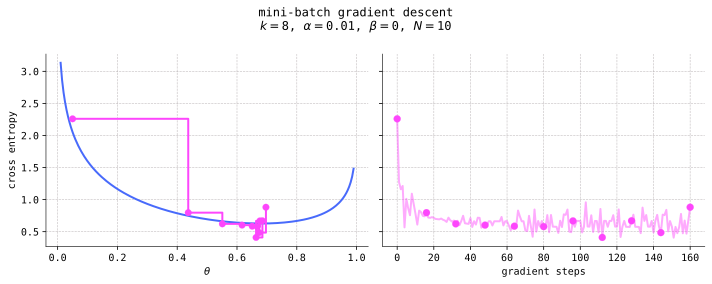

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import torch
import torch.nn.functional as F
import torch.nn as nn
from math import sqrt

import sys
sys.path.append('/Users/johnmyers/code/math_stats_ml/src/math_stats_ml')
from gd import GD, SGD, plot_sgd
#from math_stats_ml.gd import GD, SGD, plot_sgd, plot_gd

import matplotlib_inline.backend_inline
import matplotlib.colors as clr
plt.style.use('../aux-files/custom_style_light.mplstyle')
matplotlib_inline.backend_inline.set_matplotlib_formats('svg')
import warnings
warnings.filterwarnings('ignore', category=UserWarning)
blue = '#486AFB'
magenta = '#FD46FC'

torch.manual_seed(42)
theta = 0.65
m = 128
X = torch.bernoulli(torch.tensor([theta] * m))

def g(parameters, X):
    theta = parameters['theta']
    return -X * torch.log(theta) - (1 - X) * torch.log(1 - theta)

def cross_entropy(theta):
    Sigmax = sum(X)
    return -(1 / m) * (Sigmax * np.log(theta) + (m - Sigmax) * np.log(1 - theta))

parameters = {'theta': torch.tensor([0.05])}
alpha = 0.01
k = 8
N = 10

sgd_output = SGD(g=g, init_parameters=parameters, X=X, lr=alpha, batch_size=k, num_epochs=N)

epoch_step_nums = sgd_output.epoch_step_nums
objectives = sgd_output.per_step_objectives[epoch_step_nums]
running_parameters = sgd_output.parameters['theta']
running_parameters = running_parameters[epoch_step_nums]
grid = np.linspace(start=0.01, stop=0.99, num=200)

_, axes = plt.subplots(ncols=2, figsize=(10, 4), sharey=True)

axes[0].plot(grid, cross_entropy(grid))
axes[0].step(running_parameters, objectives, where='post', color=magenta)
axes[0].scatter(running_parameters, objectives, color=magenta, s=45, zorder=3)
axes[0].set_xlabel('$\\theta$')
axes[0].set_ylabel('cross entropy')

axes[1].plot(range(len(sgd_output.per_step_objectives)), sgd_output.per_step_objectives, color=magenta, alpha=0.45)
axes[1].scatter(epoch_step_nums, objectives, s=50, color=magenta, zorder=3)
axes[1].set_xlabel('gradient steps')

plt.suptitle(f'mini-batch gradient descent\n$k=${k}, $\\alpha =${alpha}, $\\beta=$0, $N = ${N}')
plt.tight_layout()

The blue curve in the left-hand plot is the graph of the _exact_ cross entropy function $H_{\hat{P}}(P_\theta)$. The magenta points---which represent a selection of outputs of the algorithm---do not fall _precisely_ on this graph since they are _approximations_ to the cross entropy, obtained as realizations of the expression on the right-hand side of

$$
H_{\hat{P}}(P_\theta) \approx \frac{1}{8} \sum_{x\in B} I_{P_\theta}(x),
$$

where $B$ is a mini-batch of data of size $k=8$. (This was discussed right after we introduced {prf:ref}`sgd-alg` in {numref}`Chapter %s <optim>`.) On the right-hand size of the figure, we have plotted the (approximate) cross entropy versus gradient steps, a type of plot familiar from {numref}`Chapter %s <optim>`. The magenta dots on the two sides of the figure correspond to each other; they represent the (approximate) cross entropies every 16 gradient steps ($=1$ epoch). Notice that the algorithm appears to be converging to the true value $\theta^\star_\text{MLE} = 87/128 \approx 0.68$ given by {prf:ref}`bern-mle-thm`.













## General MLE

In broad concept, maximum likelihood estimation works for all the probabilistic graphical models that we studied in {numref}`Chapter %s <prob-models>`, though there are some variations between the different models.

```{margin}

One should also further distinguish between the cases that the PGM contains hidden (or latent) variables, or whether all variables are visible. We shall only focus on the latter case (so-called _fully-observed models_) since the training process for models with hidden variables requires a different set of algorithms. (For example, the [expectation maximation algorithm](https://en.wikipedia.org/wiki/Expectation%E2%80%93maximization_algorithm).)
```

First, we must distinguish between training a model as a _generative model_ versus a _discriminative model_. Along with every PGM comes the joint distribution over _all_ random variables, and for a generative model, the learning process trains the model with the goal to learn the parameters of the _entire_ joint distribution, while for a discriminative model, the learning process aims at learning the parameters of only a conditional distribution. Of the types of models explicitly studied in {numref}`Chapter %s <prob-models>`---linear regression models, logistic regression models, and neural networks---all three are trained as discriminative models, aiming to learn the parameters of the conditional distributions of the response variable $Y$ given the predictor vector $\bX$. On the other hand, both the univariate Bernoulli model in the previous section and the Naive Bayes model---studied in the [programming assignment](https://github.com/jmyers7/stats-book-materials/blob/main/programming-assignments/assignment_12.ipynb) for {numref}`Chapter %s <prob-models>`---are trained as generative models.

We begin our discussion with the case of generative models, since it is essentially just a recapitulation of our discussion of the univariate Bernoulli model in the previous section. If such a model consists of $n$ random variables, say $X_1,X_2,\ldots,X_n$, then we will write them as an $n$-dimensional random vector

$$
\bX = (X_1,X_2,\ldots,X_n).
$$

For simplicity, we will assume that $\bX$ is discrete, so that if $\btheta$ is the parameter vector for the model, we have a joint mass function $p(\bx;\btheta)$. Then the same definitions given in the previous section for the univariate Bernoulli model apply here:

```{prf:definition}
:label: gen-model-functions-def

Consider a PGM trained as a generative model containing the random variables $\bX = (X_1,X_2,\ldots,X_n)$, and let $\btheta$ be the parameter vector.

1. For fixed $\bx\in \bbr^n$, the _model likelihood function_ is given by

    $$
    \calL(\btheta;\bx) \def p(\bx; \btheta),
    $$
    
    thought of as a function of $\btheta$. The _model surprisal function_ is given by

    $$
    \calI(\btheta;\bx) \def -\log \left[ \calL(\btheta;\bx) \right] = -\log \left[p(\bx; \btheta) \right],
    $$

    also thought of as a function of $\btheta$.

2. For a fixed, observed dataset $\bx_1,\bx_2,\ldots,\bx_m\in \bbr^n$, the _data likelihood function_ is given by

    $$
    \calL(\btheta;\bx_1,\ldots,\bx_m) \def p(\bx_1,\ldots,\bx_m; \btheta),
    $$

    thought of as a function of $\btheta$. The _data surprisal function_ is given by

    $$
    \calI(\btheta;\bx_1,\ldots,\bx_m) \def -\log \left[ \calL(\btheta;\bx_1,\ldots,\bx_m) \right] = -\log \left[p(\bx_1,\ldots,\bx_m; \btheta) \right],
    $$

    also thought of as a function of $\btheta$.
```

Sometimes, if mentioning the specific observation $\bx$ or the observed dataset $\bx_1,\bx_2,\ldots,\bx_m$ is not important, we will write the functions in the definition as

$$
\calL_\text{model}(\btheta), \quad \calI_\text{model}(\btheta), \quad \calL_\text{data}(\btheta), \quad \calI_\text{data}(\btheta).
$$

Since observed datasets are assumed to be observations of IID random samples, we have:

```{prf:theorem} Data likelihood/surprisal $=$ product/sum of model likelihood/surprisal
:label: likelihood-sur-decompose-thm

Consider a PGM trained as a generative model containing the random variables $\bX = (X_1,X_2,\ldots,X_n)$, and let $\btheta$ be the parameter vector. If

$$
\bx_1,\bx_2,\ldots,\bx_m\in \bbr^n
$$

is an observed dataset, then we have

$$
\calL_\text{data}(\btheta) = \prod_{i=1}^m \calL(\btheta; \bx_i) \quad \text{and} \quad \calI_\text{data}(\btheta) = \sum_{i=1}^m \calI(\btheta; \bx_i).
$$
```

Now, we state a version of {prf:ref}`equiv-obj-bern-thm` that holds for generative models:


```{prf:theorem} Equivalent learning objectives for generative PGMs
:label: equiv-obj-gen-thm

Consider a PGM trained as a generative model containing the random variables $\bX = (X_1,X_2,\ldots,X_n)$, and let $\btheta$ be the parameter vector. Let

$$
\bx_1,\bx_2,\ldots,\bx_m \in \bbr^n
$$

be an observed dataset, let $P_\btheta$ be the model joint probability distribution, and let $\hat{P}$ be the empirical distribution of the dataset. The following optimization objectives are equivalent:

1. Minimize the KL divergence $D(\hat{P} \parallel P_\btheta)$ with respect to $\btheta$.
2. Minimize the cross entropy $H_{\hat{P}}(P_\btheta)$ with respect to $\btheta$.
3. Minimize the data surprisal function $\calI(\btheta; \bx_1,\ldots,\bx_m)$ with respect to $\btheta$.
4. Maximize the data likelihood function $\calL(\btheta; \bx_1,\ldots,\bx_m)$ with respect to $\btheta$.
```

The proof of the equivalence of these training objectives is the same as the proof in the special case of the univariate Bernoulli model in the previous section. The optimization process which seeks a solution to these (equivalent) optimization problems is called _maximum likelihood estimatation_ (_MLE_), and any solution is called a _maximum likelihood estimate_ (also _MLE_) and is denoted $\btheta_\text{MLE}^\star$.

We now turn toward discriminative models, which include all those models explicitly studied in {numref}`Chapter %s <prob-models>`. In this case, we must further distinguish between the models with discrete response variable $Y$ versus a continuous one. Linear regression models are examples of the latter type, while we also briefly encountered an example of a neural network model with continuous $Y$ in the worksheet to {numref}`Chapter %s <prob-models>`. For both of these models, the response variable $Y$ was actually _normally_ distributed (conditionally), so this will be the only case of continuous $Y$ that we consider in this book.

```{prf:definition}
:label: disc-model-functions-def

Consider a PGM trained as a discriminative model with predictor vector $\bX$, response variable $Y$, and parameter vector $\btheta$.

1. For fixed $\bx\in \bbr^n$, the _model likelihood function_ is given either by

    $$
    \calL(\btheta; \ y\mid \bx) \def p(y\mid \bx;\  \btheta) \quad \text{or} \quad \calL(\btheta; \ y\mid \bx) \def f(y\mid \bx;\  \btheta),
    $$

    depending on whether $Y$ is (conditionally) discrete or continuous. The model likelihood function is thought of as a function of $\btheta$. The _model surprisal function_ is given by

    $$
    \calI(\btheta; \ y\mid \bx) \def -\log \left[ \calL(y\mid \btheta; \ \bx) \right],
    $$

    also thought of as a function of $\btheta$.

2. For a fixed, observed dataset

    $$
    (\bx_1,y_1),(\bx_2,y_2),\ldots,(\bx_m,y_m)\in \bbr^n \times \bbr,
    $$
    
    the _data likelihood function_ is given either by

    $$
    \calL(\btheta; \ y_1,\ldots,y_m \mid \bx_1,\ldots,\bx_m) \def p(y_1,\ldots,y_m \mid \bx_1,\ldots,\bx_m; \ \btheta)
    $$

    or

    $$
    \calL(\btheta; \ y_1,\ldots,y_m \mid \bx_1,\ldots,\bx_m) \def f(y_1,\ldots,y_m \mid \bx_1,\ldots,\bx_m; \ \btheta)
    $$
    
    depending on whether $Y$ is (conditionally) discrete or continuous. The data likelihood function is thought of as a function of $\btheta$. The _data surprisal function_ is given by

    $$
    \calI(\btheta;\ y\mid \bx_1,\ldots,\bx_m) \def -\log \left[ \calL(\btheta; \ y\mid \bx_1,\ldots,\bx_m) \right],
    $$

    also thought of as a function of $\btheta$.
```

As with generative models, if mentioning the specific observation or the observed dataset is not important, we will write the functions in the definition as

$$
\calL_\text{model}(\btheta), \quad \calI_\text{model}(\btheta), \quad \calL_\text{data}(\btheta), \quad \calI_\text{data}(\btheta).
$$

From independence, we also get the analog of {prf:ref}`likelihood-sur-decompose-thm`:

```{prf:theorem} Data likelihood/surprisal $=$ product/sum of model likelihood/surprisal
:label: likelihood-sur-decompose-disc-thm

Consider a PGM trained as a discriminative model with predictor vector $\bX$, response variable $Y$, and parameter vector $\btheta$. If

$$
(\bx_1,y_1),(\bx_2,y_2),\ldots,(\bx_m,y_m)\in \bbr^n \times \bbr
$$

is an observed dataset, then we have

$$
\calL_\text{data}(\btheta) = \prod_{i=1}^m \calL(\btheta; \ y_i \mid \bx_i) \quad \text{and} \quad \calI_\text{data}(\btheta) = \sum_{i=1}^m \calI(\btheta; \ y_i \mid \bx_i).
$$
```

Just as for generative models, for discriminative models we have the stochastic objective function

$$
J(\btheta) \def E_{(\bx, y) \sim \hat{p}(\bx, y)} \left[ \calI(\btheta; \ y \mid \bx) \right] = \frac{1}{m} \sum_{i=1}^m \calI(\btheta; \ y_i \mid \bx_i),
$$

```{margin}

For reasons of space and time, we did not study _conditional_ information-theoretic measures in {numref}`Chapter %s <information-theory>`. For a discussion of these quantities, see {cite}`CoverThomas2006`.
```

where $\hat{p}(\bx,y)$ is the empirical joint mass function of an observed dataset. For generative models, this function was exactly the cross entropy from the empirical distribution to the model distribution---but for discriminative models, it has a different interpretation. In the case that $Y$ is discrete, it is actually a type of _conditional_ cross entropy, and minimizing this objective is the same as minimizing the _conditional_ KL divergence. In the case that $Y$ is conditionally normal, the objective $J(\btheta)$ "is" the _mean squared error_ (or _MSE_), which we first encountered in the [programming assignment](https://github.com/jmyers7/stats-book-materials/blob/main/programming-assignments/assignment_12.ipynb) for the previous chapter. We say that it "is" the MSE, with quotation marks, because it's not _quite_ equal to the MSE on the nose---this is explained precisely in the following result:

```{prf:theorem} Mean squared error as a stochastic objective function
:label: MSE-min-thm

Consider a PGM trained as a discriminative model with predictor vector $\bX$, response variable $Y$, parameter vector $\btheta$, and let

$$
(\bx_1,y_1),(\bx_2,y_2),\ldots,(\bx_m,y_m) \in \bbr^n \times \bbr
$$

be an observed dataset with empirical joint mass function $\hat{p}(\bx,y)$. Suppose also that the conditional distribution of $Y$ given $\bX$ is normal, with _fixed_ variance $\sigma^2$, and that the mean $\mu = \mu(\bx,\btheta)$ of the distribution is the link function. Then the minimizers of the stochastic objective function

$$
E_{(\bx, y) \sim \hat{p}(\bx, y)} \left[ \calI(\btheta; \ y \mid \bx) \right] = \frac{1}{m} \sum_{i=1}^m \calI(\btheta; \ y_i \mid \bx_i)
$$

are the same as the minimizers of the mean squared error

$$
MSE(\btheta) \def \frac{1}{m} \sum_{i=1}^m (y_i - \mu_i)^2,
$$

where $\mu_i = \mu(\bx_i,\btheta)$.
```

```{prf:proof}

The proof begins with a simple computation:

\begin{align*}
\calI(\btheta; \ y_i \mid \bx_i) &= - \log \left\{ \frac{1}{\sqrt{2\pi \sigma^2}} \exp \left[- \frac{1}{2\sigma^2} (y_i - \mu_i)^2 \right] \right\} \\
&= \frac{1}{2} \log{\left(2\pi \sigma^2\right)} + \frac{1}{2\sigma^2} (y_i - \mu_i)^2.
\end{align*}

Then

$$
\frac{1}{m} \sum_{i=1}^m \calI(\btheta; \ y_i \mid \bx_i) = \frac{1}{2}\log\left(2\pi \sigma^2\right) + \frac{1}{2m\sigma^2} \sum_{i=1}^m (y_i - \mu_i)^2.
$$

Assuming that the variance $\sigma^2$ is _fixed_, we immediately see that minimizing the left-hand side with respect to $\btheta$ is the same as minimizing the MSE. Q.E.D.
```

Since multiplying an objective function by a positive constant does not change its extremizers, we may modify the mean squared error function in several ways to best suit the context. For example, sometimes it is convenient to instead consider the _residual sum of squares_ function

$$
RSS(\btheta) \def  \sum_{i=1}^m (y_i - \mu_i)^2,
$$

while in other situations we might even divide this latter quantity by $2$ and consider the equivalent objective

$$
RSS(\btheta) /2 = \frac{1}{2} \sum_{i=1}^m (y_i - \mu_i)^2.
$$

See, for example, {prf:ref}`mle-lin-reg-thm` in the next section.

Our discussion on the identity of the stochastic objective function $J(\btheta)$ is summarized in the following chart:

```{image} ../img/flow-training.svg
:width: 100%
:align: center
```
&nbsp;

Again, care must be taken in interpreting $J(\btheta)$ in the case of a discriminative model with (conditionally) normal $Y$, since it is technically not equal to the MSE exactly, and we must also assume that the variance $\sigma^2$ is _fixed_, as discussed in {prf:ref}`MSE-min-thm`. In any case, we may now state the following theorem, which is a version of {prf:ref}`equiv-obj-gen-thm` for discriminative models:

```{prf:theorem} Equivalent learning objectives for discriminative PGMs
:label: equiv-obj-disc-thm

Consider a PGM trained as a discriminative model with predictor vector $\bX$, response variable $Y$, and parameter vector $\btheta$. Let

$$
(\bx_1,y_1),(\bx_2,y_2),\ldots,(\bx_m,y_m) \in \bbr^n \times \bbr
$$

be an observed dataset, with empirical joint mass function $\hat{p}(\bx,y)$. The following optimization objectives are equivalent:

1. Minimize the stochastic objective function

    $$
    J(\btheta) \def E_{(\bx, y) \sim \hat{p}(\bx, y)} \left[ \calI(\btheta; \ y \mid \bx) \right] = \frac{1}{m} \sum_{i=1}^m \calI(\btheta; \ y_i \mid \bx_i)
    $$

    with respect to $\btheta$.
2. Minimize the data surprisal function $\calI(\btheta; \ y_1,\ldots,y_m \mid \bx_1,\ldots,\bx_m)$ with respect to $\btheta$.
3. Maximize the data likelihood function $\calL(\btheta; \ y_1,\ldots,y_m \mid \bx_1,\ldots,\bx_m)$ with respect to $\btheta$.
```

Just as for generative models, the optimization process which seeks a solution to these (equivalent) optimization problems is called _maximum likelihood estimation_ (_MLE_), and any solution is called a _maximum likelihood estimate_ (also _MLE_) and is denoted $\btheta_\text{MLE}^\star$.














## MLE for linear regression

Having studied maximum likelihood estimation in general, we now turn toward specific examples, beginning with linear regression models. These are trained as discriminative models with a response variable $Y$ which is (conditionally) normal. If we assume that the variance parameter $\sigma^2$ is _fixed_, then the underlying graph of the model is of the form

&nbsp;
```{image} ../img/log-reg-00.svg
:width: 35%
:align: center
```
&nbsp;

where $\beta_0 \in \bbr$ and $\bbeta \in \mathbb{R}^{n}$ are the only parameters. The link function at $Y$ is still given by

$$
Y \mid \bX=\bx ; \ \beta_0,\bbeta \sim \mathcal{N}(\mu, \sigma^2), \quad \text{where} \quad \mu = \beta_0 + \bx^\intercal \bbeta.
$$

For these models, it turns out MLEs are obtainable in closed form:

```{prf:theorem} MLEs for linear regression models with known variance
:label: mle-lin-reg-thm

Consider a linear regression model with _fixed_ variance $\sigma^2$, and let

$$
(\bx_1,y_1),(\bx_2,y_2),\ldots,(\bx_m,y_m) \in \bbr^n \times \bbr
$$

be an observed dataset. Supposing $\bx_i^\intercal= (x_{i1},x_{i2},\ldots,x_{in})$ for each $i=1,\ldots,m$, let

$$
\mathbfcal{X} = \begin{bmatrix}
1 & x_{11} & \cdots & x_{1n} \\
\vdots & \vdots & \ddots & \vdots \\
1 & x_{m1} & \cdots & x_{mn}
\end{bmatrix}, \quad \by = \begin{bmatrix} y_1 \\ \vdots \\ y_m \end{bmatrix}, \quad \btheta = \begin{bmatrix} \beta_0 \\ \beta_1 \\ \vdots \\ \beta_n \end{bmatrix}
$$

where $\bbeta^\intercal = (\beta_1,\ldots,\beta_n)$. Provided that the $(n+1) \times (n+1)$ square matrix $\mathbfcal{X}^T \mathbfcal{X}$ is invertible, maximum likelihood estimates for the parameters $\beta_0$ and $\bbeta$ are given by

$$
\btheta_\text{MLE}^\star = \left(\mathbfcal{X}^T \mathbfcal{X}\right)^{-1}\mathbfcal{X}^T \by.
$$
```

```{prf:proof}
As we noted above in the discussion after the proof of {prf:ref}`MSE-min-thm`, the MLE may be obtained as the minimizer of half the residual sum of squares:

$$
J(\btheta) \def RSS(\btheta)/2 = \frac{1}{2} \sum_{i=1}^m (y_i - \mu_i)^2 = \frac{1}{2} \left( \by - \mathbfcal{X}\btheta\right)^\intercal \left( \by - \mathbfcal{X}\btheta\right),
$$

where $\mu_i = \beta_0 + \bx_i^\intercal \bbeta$ for each $i=1,\ldots,m$. But as we will show in the worksheet problem directly after this proof, taking the gradient gives

$$
\nabla J(\btheta) = \left( \by - \mathbfcal{X}\btheta\right)^\intercal \nabla_\btheta \left(\by - \mathbfcal{X}\btheta \right),
$$

where $\nabla_\btheta \left(\by - \mathbfcal{X}\btheta \right)$ is the Jacobian matrix of the vector-valued function $\btheta \mapsto \by - \mathbfcal{X} \btheta$. But it is easy to show that $\nabla_\btheta \left(\by - \mathbfcal{X}\btheta \right) = - \mathbfcal{X}$, and so

$$
\nabla J(\btheta) =  -\left( \by - \mathbfcal{X}\btheta\right)^\intercal \mathbfcal{X}.
$$ (grad-rss-eq)

Setting the gradient to zero and rearranging gives

$$
\mathbfcal{X}^\intercal \mathbfcal{X} \btheta = \mathbfcal{X}^\intercal \by,
$$

from which the desired equation follows.

The only thing that is left to prove is that we have actually obtained a global minimizer. But this follows from convexity of the objective function $J(\btheta)$, which we may demonstrate by showing the Hessian matrix $\nabla^2 J(\btheta)$ is positive semidefinite (see {prf:ref}`main-convex-multi-thm`). To do this, note that $\nabla^2 J(\btheta) = \mathbfcal{X}^\intercal \mathbfcal{X}$ from {eq}`grad-rss-eq`. But then, given any vector $\bz \in \bbr^{n+1}$, we have

$$
\bz^\intercal \nabla^2 J(\btheta) \bz = \bz^\intercal \mathbfcal{X}^\intercal \mathbfcal{X} \bz = (\mathbfcal{X}\bx)^\intercal \mathbfcal{X} \bz = |\mathbfcal{X}\bz|^2 \geq 0.
$$

Thus the Hessian matrix is indeed positive semidefinite. Q.E.D.
```

As we saw in the proof, the maximum likelihood parameter estimates are those that minimize the residual sum of squares $RSS(\btheta)$, which explains why the MLEs are also often called the _ordinary least squares_ (_OLS_) estimates.

It is worth writing out the MLEs in the case of simple linear regression:

```{prf:corollary} MLEs for simple linear regression models with known variance
:label: mle-simple-lin-reg-cor

Let the notation be as in {prf:ref}`mle-lin-reg-thm`, but assume that $\bX$ is $1$-dimensional, equal to a random variable $X$. Then MLEs for the parameters $\beta_0$ and $\beta_1$ are given by

\begin{align*}
(\beta_1)_\text{MLE}^\star &= \frac{\sum_{i=1}^m \left(x_i - \bar{x} \right)\left( y_i - \bar{y} \right)}{\sum_{i=1}^m \left(x_i - \bar{x} \right)^2}, \\
(\beta_0)_\text{MLE}^\star &= \bar{y} - \beta_1 \bar{x},
\end{align*}

where $\bar{x} = \frac{1}{m} \sum_{i=1}^m x_i$ and $\bar{y} = \frac{1}{m} \sum_{i=1}^m y_i$ are the empirical means.
```

```{prf:proof}

First note that

$$
\mathbfcal{X}^\intercal \mathbfcal{X} = \begin{bmatrix} m & m \bar{x} \\ m \bar{x} & \sum_{i=1}^m x_i^2 \end{bmatrix}.
$$

Assuming this matrix has nonzero determinant, we have

$$
\left(\mathbfcal{X}^\intercal \mathbfcal{X} \right)^{-1} = \frac{1}{m \sum_{i=1}^m x_i^2 - m^2 \bar{x}^2} \begin{bmatrix} \sum_{i=1}^m x_i^2 & -m \bar{x} \\ -m \bar{x} & m \end{bmatrix}.
$$

But

$$
\mathbfcal{X}^\intercal \by = \begin{bmatrix} m \bar{y} \\ \sum_{i=1}^m x_i y_i \end{bmatrix},
$$

and so from

$$
\begin{bmatrix} \beta_0 \\ \beta_1 \end{bmatrix} = \btheta =  \left(\mathbfcal{X}^\intercal \mathbfcal{X}\right)^{-1}\mathbfcal{X}^\intercal \by
$$

we conclude

$$
\beta_1 = \frac{\sum_{i=1}^m x_i y_i -m \bar{x}\bar{y} }{ \sum_{i=1}^m x_i^2 - m \bar{x}^2}.
$$

But as you may easily check, we have

$$
\sum_{i=1}^m x_i y_i -m \bar{x}\bar{y}  = \sum_{i=1}^m \left(x_i - \bar{x} \right)\left( y_i - \bar{y} \right)
$$

and

$$
\sum_{i=1}^m x_i^2 - m \bar{x}^2 = \sum_{i=1}^m \left(x_i - \bar{x} \right)^2,
$$

from which the desired equation for $\beta_1$ follows. To obtain the equation for $\beta_0$, note that the equation

$$
\mathbfcal{X}^\intercal \mathbfcal{X} \begin{bmatrix} \beta_0 \\ \beta_1 \end{bmatrix} = \mathbfcal{X}^\intercal \by 
$$

implies $m \beta_0  + m \beta_1 \bar{x} = m \bar{y}$, and so $\beta_0 = \bar{y} - \beta_1 \bar{x}$. Q.E.D.
```

To illustrate the concepts, let's return yet again to the Ames housing dataset (see the description at the beginning of {numref}`lin-reg-sec`). While in principle we may compute the _exact_ MLEs for a linear regression model on this data, it is amusing to approximate them using stochastic gradient descent. To do this, however, we must "standardize" the area and price features for numerical stability, which means that we subtract the empirical means and divide by the standard deviations. When we do so, we get a scatter plot that looks like:

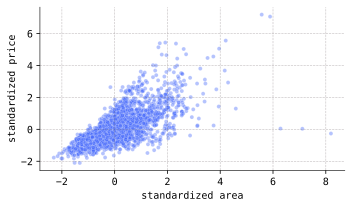

In [2]:
from sklearn.preprocessing import StandardScaler

# import data
url = 'https://raw.githubusercontent.com/jmyers7/stats-book-materials/main/data/data-3-1.csv'
df = pd.read_csv(url, usecols=['area', 'price'])

ss = StandardScaler()
data_std = ss.fit_transform(df.to_numpy())

sns.scatterplot(x=data_std[:, 0], y=data_std[:, 1], alpha=0.4)
plt.gcf().set_size_inches(w=5, h=3)
plt.xlabel('standardized area')
plt.ylabel('standardized price')
plt.tight_layout()

Notice that both features are on similar scales. Then, we run the algorithm using the mean squared error function

$$
MSE(\btheta) = \frac{1}{m} \sum_{i=1}^m (y_i - \beta_0 - \beta x_i)^2, \quad \btheta = (\beta_0, \beta),
$$

as the objective function:

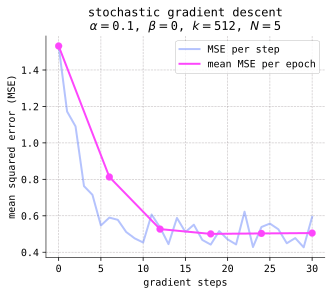

In [3]:
X = torch.tensor(data_std[:, 0], dtype=torch.float32)
y = torch.tensor(data_std[:, 1], dtype=torch.float32)

beta0 = torch.tensor([1.])
beta = torch.tensor([1.])
theta0 = {'beta0': beta0, 'beta': beta}

def g(parameters, x, y):
    beta0 = parameters['beta0']
    beta = parameters['beta']
    return (y - beta0 - beta * x) ** 2

alpha = 0.1
N = 5
k = 512

sgd_output = SGD(g=g, init_parameters=theta0, X=X, y=y, lr=alpha, batch_size=k, num_epochs=N, random_state=42)

plot_sgd(sgd_output,
         ylabel='mean squared error (MSE)',
         per_step_label='MSE per step',
         per_epoch_label='mean MSE per epoch',
         per_epoch_color=magenta,
         legend=True,
         per_step_alpha=0.4)

## MLE for logistic regression

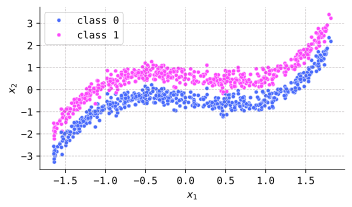

In [4]:
url = 'https://raw.githubusercontent.com/jmyers7/stats-book-materials/main/data/ch12-book-data-01.csv'
df = pd.read_csv(url)

# convert the data to numpy arrays
X = df[['x_1', 'x_2']].to_numpy()
y = df['y'].to_numpy()

# convert the data to torch tensors
X = torch.tensor(data=X, dtype=torch.float32)
y = torch.tensor(data=y, dtype=torch.float32)

# plot the data
g = sns.scatterplot(data=df, x='x_1', y='x_2', hue='y')

# change the default seaborn legend
g.legend_.set_title(None)
new_labels = ['class 0', 'class 1']
for t, l in zip(g.legend_.texts, new_labels):
    t.set_text(l)

plt.xlabel('$x_1$')
plt.ylabel('$x_2$')
plt.gcf().set_size_inches(w=5, h=3)
plt.tight_layout()

In [5]:
# define the link function at Y
def phi(X, parameters):
    beta0 = parameters['beta0']
    beta = parameters['beta']
    return torch.sigmoid(beta0 + X @ beta)

# define the data surprisal function
def I(parameters):
    probs = phi(X, parameters)
    return torch.sum(-y * torch.log(probs) - (1 - y) * torch.log(1 - probs))

# define the predictor
def predictor(X, parameters):
    probs = phi(X, parameters)
    return (probs >= 0.5).to(torch.int)

# initialize the weights and biases
torch.manual_seed(42)
beta0 = torch.normal(mean=0, std=1e-1, size=(1,))
beta = torch.normal(mean=0, std=1e-1, size=(2,))
theta0 = {'beta0': beta0, 'beta': beta}

# run gradient descent
N = 50
alpha = 1e-3
gd_output = GD(J=I, init_parameters=theta0, lr=alpha, num_steps=N)

# define grid for contour plot
resolution = 1000
x1_grid = torch.linspace(-2, 2, resolution)
x2_grid = torch.linspace(-4, 4, resolution)
x1_grid, x2_grid = torch.meshgrid(x1_grid, x2_grid)
grid = torch.column_stack((x1_grid.reshape((resolution ** 2, -1)), x2_grid.reshape((resolution ** 2, -1))))

# define colormap for the contour plots
desat_blue = '#7F93FF'
desat_magenta = '#FF7CFE'
binary_cmap = clr.LinearSegmentedColormap.from_list(name='binary', colors=[desat_blue, desat_magenta], N=2)

epoch_list = [0, 3, N]
running_parameters = gd_output.parameters

_, axes = plt.subplots(ncols=2, nrows=len(epoch_list), figsize=(10, 9))

for i, epoch in enumerate(epoch_list):
    parameters = {key: value[epoch] for key, value in running_parameters.items()}
    
    # plot the objective function
    axes[i, 0].plot(gd_output.grad_steps, gd_output.per_step_objectives, label='surprisal per step')
    axes[i, 0].set_xlabel('gradient steps')
    axes[i, 0].set_ylabel('surprisal')
    axes[i, 0].scatter(epoch_list[i], gd_output.per_step_objectives[epoch], color=magenta, s=100, zorder=3)
    axes[i, 0].legend()

    # apply the fitted model to the grid
    z = predictor(grid, parameters)

    # plot the decision boundary and colors
    z = z.reshape(shape=(resolution, resolution))
    axes[i, 1].contourf(x1_grid, x2_grid, z, cmap=binary_cmap)
    axes[i, 1].set_xlabel('$x_1$')
    axes[i, 1].set_ylabel('$x_2$')

    # plot the data
    g = sns.scatterplot(data=df, x='x_1', y='x_2', hue='y', ax=axes[i, 1])

    # change the default seaborn legend
    g.legend_.set_title(None)
    new_labels = ['class 0', 'class 1']
    for t, l in zip(g.legend_.texts, new_labels):
        t.set_text(l)
    
plt.suptitle(f'gradient descent\n$\\alpha={alpha}$, $\\beta=0$, $N={N}$')
plt.tight_layout()

## MLE for neural networks

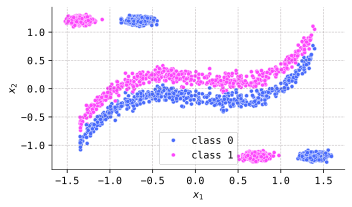

In [6]:
url = 'https://raw.githubusercontent.com/jmyers7/stats-book-materials/main/data/ch12-book-data-02.csv'
df = pd.read_csv(url)

# convert the data to numpy arrays
X = df[['x_1', 'x_2']].to_numpy()
y = df['y'].to_numpy()

# convert the data to torch tensors
X = torch.tensor(data=X, dtype=torch.float32)
y = torch.tensor(data=y, dtype=torch.float32)

# plot the data
g = sns.scatterplot(data=df, x='x_1', y='x_2', hue='y')

# change the default seaborn legend
g.legend_.set_title(None)
new_labels = ['class 0', 'class 1']
for t, l in zip(g.legend_.texts, new_labels):
    t.set_text(l)

plt.xlabel('$x_1$')
plt.ylabel('$x_2$')
plt.gcf().set_size_inches(w=5, h=3)
plt.tight_layout()

In [7]:
# define the link function at Y
def phi(X, parameters):
    Z_0 = X
    Z_1 = F.relu(Z_0 @ parameters['weight_1'] + parameters['bias_1'])
    Z_2 = F.relu(Z_1 @ parameters['weight_2'] + parameters['bias_2'])
    Z_3 = F.relu(Z_2 @ parameters['weight_3'] + parameters['bias_3'])
    return torch.sigmoid(Z_3 @ parameters['weight_4'] + parameters['bias_4'])

# define the model surprisal function
def I(parameters, X, y):
    probs = phi(X, parameters)
    return -y * torch.log(probs) - (1 - y) * torch.log(1 - probs)

# define the predictor
def predictor(X, parameters):
    probs = phi(X, parameters)
    return (probs >= 0.5).to(torch.int)

# define the network architecture
k1 = 8 # width of first hidden layer
k2 = 8 # width of second hidden layer
k3 = 4 # width of third hidden layer
widths = [2, k1, k2, k3, 1]

# initialize the weights and biases
torch.manual_seed(42)
theta0 = {}
for i in range(1, 5):
    weight = torch.empty(widths[i-1], widths[i])
    bias = torch.empty(widths[i])
    nn.init.uniform_(weight, a=-1/sqrt(widths[i-1]), b=1/sqrt(widths[i-1]))
    nn.init.uniform_(bias, a=-1/sqrt(widths[i-1]), b=1/sqrt(widths[i-1]))
    theta0 = theta0 | {'weight_' + str(i): weight.squeeze()}
    theta0 = theta0 | {'bias_' + str(i): bias}

# run SGD
N = 80
k = 128
alpha = 0.1
sgd_output = SGD(g=I, init_parameters=theta0, X=X, y=y, lr=alpha, batch_size=k, num_epochs=N, random_state=42)

# get the grid for the contour plot
resolution = 1000
x1_grid = torch.linspace(-1.75, 1.75, resolution)
x2_grid = torch.linspace(-1.5, 1.5, resolution)
x1_grid, x2_grid = torch.meshgrid(x1_grid, x2_grid)
grid = torch.column_stack((x1_grid.reshape((resolution ** 2, -1)), x2_grid.reshape((resolution ** 2, -1))))

epoch_list = [0, 750, len(sgd_output.per_step_objectives) - 1]
running_parameters = sgd_output.parameters

_, axes = plt.subplots(ncols=2, nrows=len(epoch_list), figsize=(10, 9))

for i, epoch in enumerate(epoch_list):
    parameters = {key: value[epoch] for key, value in running_parameters.items()}
    
    # plot the objective function
    axes[i, 0].plot(sgd_output.grad_steps, sgd_output.per_step_objectives, alpha=0.25, label='cross entropy per step')
    axes[i, 0].plot(sgd_output.epoch_step_nums, sgd_output.per_epoch_objectives, label='mean cross entropy per epoch')
    axes[i, 0].set_xlabel('gradient steps')
    axes[i, 0].set_ylabel('cross entropy')
    axes[i, 0].scatter(epoch_list[i], sgd_output.per_step_objectives[epoch], color=magenta, s=100, zorder=3)
    axes[i, 0].legend()

    # apply the fitted model to the grid
    z = predictor(grid, parameters)

    # plot the decision boundary and colors
    z = z.reshape(shape=(resolution, resolution))
    axes[i, 1].contourf(x1_grid, x2_grid, z, cmap=binary_cmap)
    axes[i, 1].set_xlabel('$x_1$')
    axes[i, 1].set_ylabel('$x_2$')

    # plot the data
    g = sns.scatterplot(data=df, x='x_1', y='x_2', hue='y', ax=axes[i, 1])

    # change the default seaborn legend
    g.legend_.set_title(None)
    new_labels = ['class 0', 'class 1']
    for t, l in zip(g.legend_.texts, new_labels):
        t.set_text(l)
    
plt.suptitle(f'mini-batch gradient descent\n$\\alpha={alpha}$, $\\beta=0$, $k={k}$, $N={N}$')
plt.tight_layout()